# Tranfer Learninig with tensorflow part 3 : Scaling up 

In [1]:
# import python helper funtions 

from helper_functions import create_tensorboard_callback , plot_loss_curves,unzip_data,compare_historys,walk_through_dir

In [2]:
unzip_data('101_food_classes_10_percent.zip')

In [3]:
train_dir = '101_food_classes_10_percent/train'

test_dir = '101_food_classes_10_percent/test'

In [4]:
walk_through_dir('101_food_classes_10_percent')

There are 2 directories and 0 images in '101_food_classes_10_percent'.
There are 101 directories and 0 images in '101_food_classes_10_percent\test'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\apple_pie'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\baby_back_ribs'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\baklava'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beef_carpaccio'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beef_tartare'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beet_salad'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beignets'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\bibimbap'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\bread_pudding'.
There are 0 directories and 250 images in '10

In [5]:
# Setup data inputs 

import tensorflow as tf 
IMG_SIZE = (224,224)

train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                                label_mode='categorical',
                                                                                image_size=IMG_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode='categorical',
                                                                image_size=IMG_SIZE,
                                                                shuffle=False)


Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


## Train a modelwith tranfer learning on 10% 101 food classes 

here are the steps we are going to take 
* Create a ModelCheckPoint callback
* Create a data augmentation layyer to build data augmentation right into the model 
* Build a headless model Functional EfficientNetB0 backboned-model (we will create our own output layer)
* Compile our model 
* Feature extract for 5 full passes 

In [6]:
# Create checkpoint call ack

checkpoint_path = '101_food_classes_10_percent_data_model_checkpoint'
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                         save_weights_only=True,
                                                         monitor='val_accuracy',
                                                         save_best_only=True)

In [7]:
# Create data augmentation layer to incoperate it into right into the model 

from tensorflow.keras import layers # type: ignore
from tensorflow.keras.layers.experimental import preprocessing  # type: ignore
from tensorflow.keras.models import Sequential  # type: ignore

# setup data augmentaion 

data_augmentation = Sequential([
    preprocessing.RandomFlip('horizontal'),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomZoom(0.2),
],name = 'data_augmentation')


In [8]:
# Setup  the base model and freeze its layer 

base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# setup model architecture with trainable top layers
inputs = layers.Input(shape=(224,224,3),name = 'input_layer')
x = data_augmentation(inputs)
x = base_model(x,training =False)
x = layers.GlobalAveragePooling2D(name ='global_avg_pool_layer')(x)

outputs = layers.Dense(len(train_data_all_10_percent.class_names),activation ='softmax',name ='output_layer')(x) # type: ignore
model = tf.keras.Model(inputs,outputs)



In [9]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainab

In [10]:
# compile the model 
model.compile(loss='categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(),
              metrics = 'accuracy')

In [11]:
# fit the model 
history_all_classes_10_percent = model.fit(train_data_all_10_percent,
                                           epochs=5,
                                           validation_data=test_data,
                                           validation_steps=int(0.15*len(test_data)),
                                           callbacks=[checkpoint_callback])

Epoch 1/5
237/237 [==============================] - 137s 533ms/step - loss: 3.3508 - accuracy: 0.2863 - val_loss: 2.4924 - val_accuracy: 0.4574
Epoch 2/5
237/237 [==============================] - 119s 503ms/step - loss: 2.2121 - accuracy: 0.4907 - val_loss: 2.0336 - val_accuracy: 0.5172
Epoch 3/5
237/237 [==============================] - 130s 548ms/step - loss: 1.8159 - accuracy: 0.5665 - val_loss: 1.8816 - val_accuracy: 0.5289
Epoch 4/5
237/237 [==============================] - 129s 542ms/step - loss: 1.6083 - accuracy: 0.6057 - val_loss: 1.8065 - val_accuracy: 0.5363
Epoch 5/5
237/237 [==============================] - 129s 543ms/step - loss: 1.4552 - accuracy: 0.6407 - val_loss: 1.7571 - val_accuracy: 0.5445


In [12]:
# evaluate on the whole test dataset 

feature_extraction_results = model.evaluate(test_data)
feature_extraction_results

790/790 [==============================] - 50s 64ms/step - loss: 1.5834 - accuracy: 0.5847


[1.5834094285964966, 0.5847128629684448]

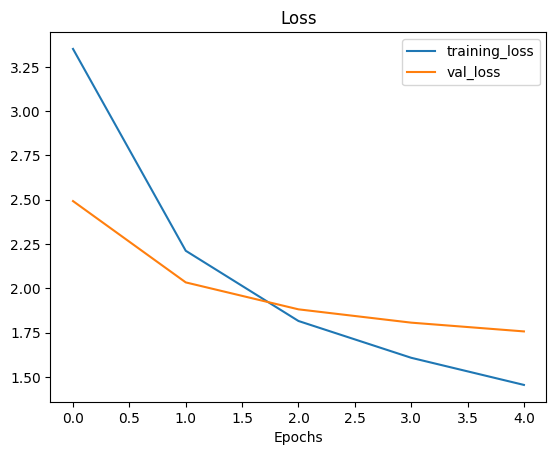

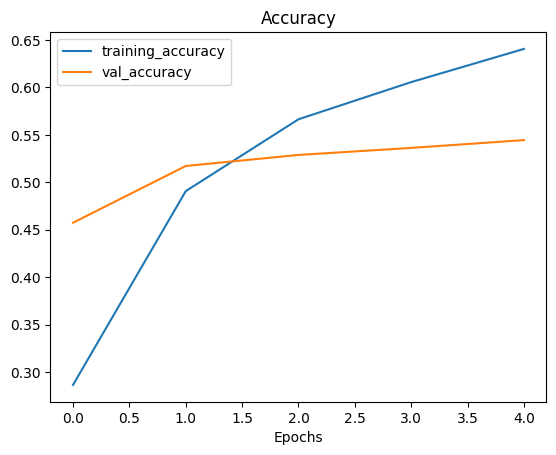

In [13]:
plot_loss_curves(history_all_classes_10_percent)

> our model is overfitting 

## Fine-tuning 

In [14]:
# unfreeze all of the layers in base model 
base_model.trainable = True 

# Refreeze every layer expet the last 5 

for layer in base_model.layers[:-5]:
    layer.trainable =False

In [15]:
# Recompile model with lower learning rate 
model.compile(loss ='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              metrics ='accuracy')

In [16]:
# what layers in the model are trainable
for layer in  model.layers:
    print(layer.name,layer.trainable)

input_layer True
data_augmentation True
efficientnetb0 True
global_avg_pool_layer True
output_layer True


In [17]:
# check which layers are trainable in our base model 
for layer_numbers , layer in enumerate(model.layers[2].layers):
    print(layer_numbers,layer.name,layer.trainable)

0 input_1 False
1 rescaling False
2 normalization False
3 rescaling_1 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze False
39

In [18]:
# Fine-tune for 5 more epochs 
fine_tune_epochs = 5

# fine tune our model  
history_fine_tune = model.fit(train_data_all_10_percent,
                              epochs=fine_tune_epochs,
                              validation_data=test_data,
                              validation_steps=int(0.15*len(test_data)),
                              initial_epoch=history_all_classes_10_percent.epoch[-1])

Epoch 5/5
237/237 [==============================] - 142s 554ms/step - loss: 1.2110 - accuracy: 0.6866 - val_loss: 1.6998 - val_accuracy: 0.5437


In [19]:
# evaluate on the whole test data 
all_classes_10_percent_fine_tuning_results = model.evaluate(test_data) 
all_classes_10_percent_fine_tuning_results

790/790 [==============================] - 52s 65ms/step - loss: 1.5205 - accuracy: 0.5909


[1.520497441291809, 0.5908514857292175]

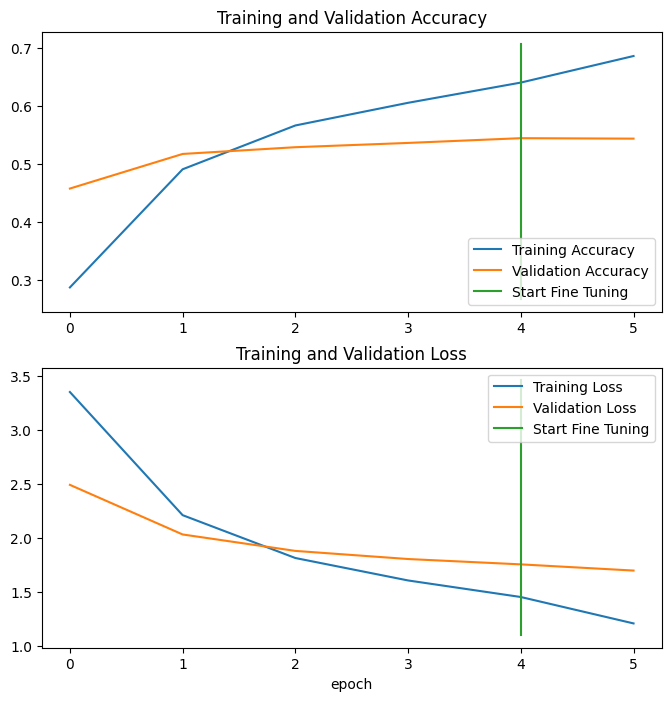

In [20]:
# compare the history of feature extraction and fine tune models

compare_historys(history_all_classes_10_percent,history_fine_tune,initial_epochs=5)

## Saving and loading our model 
To use our model in an external application , we'll need to save and export it somewhere 

In [21]:
# As im using tf version of 2.10 model.save is giving error ,so i made a quick fix as i didnt needed to export the model in another framework , when i want export the model ,i have to use another version of model
# model.save('food_vision_saved_model/10_percent_saved_model')
# tf.keras.model.save(model,'food_vision_saved_model')
# Loaded_model = tf.keras.model.load_model('food_vision_saved_model/model)

In [22]:

loaded_model = model
loaded_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 910,821
Non-trainab

In [23]:
loaded_model_results = loaded_model.evaluate(test_data)
loaded_model_results

790/790 [==============================] - 52s 65ms/step - loss: 1.5205 - accuracy: 0.5909


[1.520497441291809, 0.5908514857292175]

In [24]:
all_classes_10_percent_fine_tuning_results

[1.520497441291809, 0.5908514857292175]

In [25]:
loaded_model_results == all_classes_10_percent_fine_tuning_results

True

## Evaluating the perforance of the model across all different classes
Lets make some redictions,visualize them and then later find out whih predictions were the most wrong

In [26]:
# unzip_data('06_101_food_class_10_percent_saved_big_dog_model.zip')s

In [27]:
model = tf.keras.models.load_model('06_101_food_class_10_percent_saved_big_dog_model')

In [28]:
results_downloaded_model = model.evaluate(test_data) # type: ignore
results_downloaded_model

790/790 [==============================] - 54s 66ms/step - loss: 1.8027 - accuracy: 0.6078


[1.802720546722412, 0.6077623963356018]

## Making predictions with our trained model 

In [29]:
# make predictions with model 
pred_prob = model.predict(test_data,verbose=1) # type: ignore

790/790 [==============================] - 52s 63ms/step


In [30]:
# how many predictions are there
len(pred_prob)

25250

In [31]:
# shape of or predictions 
pred_prob.shape


(25250, 101)

In [32]:
# lets see what the first 10 predicitons look like 
pred_prob[0] , len(pred_prob[0]), sum(pred_prob[0])

(array([5.95418811e-02, 3.57422778e-06, 4.13769707e-02, 1.06606346e-09,
        8.16151946e-09, 8.66399663e-09, 8.09278504e-07, 8.56523059e-07,
        1.98591333e-05, 8.09785831e-07, 3.17280868e-09, 9.86747750e-07,
        2.85323244e-04, 7.80493448e-10, 7.42298493e-04, 3.89165980e-05,
        6.47409070e-06, 2.49774075e-06, 3.78913501e-05, 2.06783753e-07,
        1.55385733e-05, 8.15069257e-07, 2.62306025e-06, 2.00107706e-07,
        8.38279277e-07, 5.42163752e-06, 3.73910530e-06, 1.31506352e-08,
        2.77616084e-03, 2.80518070e-05, 6.85627277e-10, 2.55748728e-05,
        1.66889891e-04, 7.64081187e-10, 4.04531136e-04, 1.31507916e-08,
        1.79574909e-06, 1.44482965e-06, 2.30630469e-02, 8.24672725e-07,
        8.53662868e-07, 1.71386841e-06, 7.05260209e-06, 1.84022397e-08,
        2.85535180e-07, 7.94830248e-06, 2.06817936e-06, 1.85252659e-07,
        3.36200401e-08, 3.15227662e-04, 1.04109922e-05, 8.54495056e-07,
        8.47418487e-01, 1.05554900e-05, 4.40946735e-07, 3.740435

Our model outputs a prediction probability array for each saple passed to the passed method

In [33]:
# We get one prediction probaility per class 
print(f'Number of predictions for sammple 0 : {len(pred_prob[0])}')
print(f'What prediction proability sample 0 looks like : \n {pred_prob[0]}')
print(f'The class wth highest predicted probabilty by the model for sample 0 : {pred_prob[0].argmax()}')

Number of predictions for sammple 0 : 101
What prediction proability sample 0 looks like : 
 [5.95418811e-02 3.57422778e-06 4.13769707e-02 1.06606346e-09
 8.16151946e-09 8.66399663e-09 8.09278504e-07 8.56523059e-07
 1.98591333e-05 8.09785831e-07 3.17280868e-09 9.86747750e-07
 2.85323244e-04 7.80493448e-10 7.42298493e-04 3.89165980e-05
 6.47409070e-06 2.49774075e-06 3.78913501e-05 2.06783753e-07
 1.55385733e-05 8.15069257e-07 2.62306025e-06 2.00107706e-07
 8.38279277e-07 5.42163752e-06 3.73910530e-06 1.31506352e-08
 2.77616084e-03 2.80518070e-05 6.85627277e-10 2.55748728e-05
 1.66889891e-04 7.64081187e-10 4.04531136e-04 1.31507916e-08
 1.79574909e-06 1.44482965e-06 2.30630469e-02 8.24672725e-07
 8.53662868e-07 1.71386841e-06 7.05260209e-06 1.84022397e-08
 2.85535180e-07 7.94830248e-06 2.06817936e-06 1.85252659e-07
 3.36200401e-08 3.15227662e-04 1.04109922e-05 8.54495056e-07
 8.47418487e-01 1.05554900e-05 4.40946735e-07 3.74043520e-05
 3.53063915e-05 3.24892171e-05 6.73145623e-05 1.28526

In [34]:
test_data.class_names[52] # type: ignore

'gyoza'

In [35]:
# Get the pred classes of each label 
pred_classes = pred_prob.argmax(axis=1)

pred_classes[:10]

array([52,  0,  0, 80, 79, 61, 29,  0, 85,  0], dtype=int64)

In [36]:
len(pred_classes)

25250

Now we've got a predicitons array of all our models predictions to evaluate the ,we need to copare the to the labels

In [37]:
# To get our test labels we need to unravel our test_data BatchDataset
y_labels = []
for images ,labels in test_data.unbatch(): # type: ignore
    y_labels.append(labels.numpy().argmax())

y_labels[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [38]:
len(y_labels)

25250

## Evaluating our models predictions
one way to check that our models predictions array is in the same order as our test labels array is to find the accuracy score

In [39]:
results_downloaded_model

[1.802720546722412, 0.6077623963356018]

In [40]:
# Lets try scikit learn accuracy score functions

from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_true=y_labels,y_pred = pred_classes)

sklearn_accuracy

0.6077623762376237

## Lets get visual : making a confusion matrix

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix

In [42]:
class_names = test_data.class_names # type: ignore
class_names

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [43]:
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better # type: ignore
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()
    ### Changed (plot x-lables vertially)
  plt.xticks(rotation =70,fontsize = text_size)
  plt.yticks(fontsize = text_size)


  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png"), make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False) # type: ignore
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better # type: ignore
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [44]:

make_confusion_matrix(y_true=y_labels,y_pred=pred_classes,classes = class_names,figsize=(100,100),text_size=20)

## Time for classification report 

In [45]:
from sklearn.metrics import classification_report

print(classification_report(y_true=y_labels,y_pred=pred_classes))

              precision    recall  f1-score   support

           0       0.29      0.20      0.24       250
           1       0.51      0.69      0.59       250
           2       0.56      0.65      0.60       250
           3       0.74      0.53      0.62       250
           4       0.73      0.43      0.54       250
           5       0.34      0.54      0.42       250
           6       0.67      0.79      0.72       250
           7       0.82      0.76      0.79       250
           8       0.40      0.37      0.39       250
           9       0.62      0.44      0.51       250
          10       0.62      0.42      0.50       250
          11       0.84      0.49      0.62       250
          12       0.52      0.74      0.61       250
          13       0.56      0.60      0.58       250
          14       0.56      0.59      0.57       250
          15       0.44      0.32      0.37       250
          16       0.45      0.75      0.57       250
          17       0.37    

In [46]:
# Get a dictionary of the classification report 
classification_report_dict = classification_report(y_labels,pred_classes,output_dict=True)
classification_report_dict

{'0': {'precision': 0.29310344827586204,
  'recall': 0.204,
  'f1-score': 0.24056603773584906,
  'support': 250.0},
 '1': {'precision': 0.5088235294117647,
  'recall': 0.692,
  'f1-score': 0.5864406779661017,
  'support': 250.0},
 '2': {'precision': 0.5625,
  'recall': 0.648,
  'f1-score': 0.6022304832713755,
  'support': 250.0},
 '3': {'precision': 0.7415730337078652,
  'recall': 0.528,
  'f1-score': 0.616822429906542,
  'support': 250.0},
 '4': {'precision': 0.7346938775510204,
  'recall': 0.432,
  'f1-score': 0.5440806045340051,
  'support': 250.0},
 '5': {'precision': 0.34177215189873417,
  'recall': 0.54,
  'f1-score': 0.4186046511627907,
  'support': 250.0},
 '6': {'precision': 0.6677966101694915,
  'recall': 0.788,
  'f1-score': 0.7229357798165138,
  'support': 250.0},
 '7': {'precision': 0.8197424892703863,
  'recall': 0.764,
  'f1-score': 0.7908902691511387,
  'support': 250.0},
 '8': {'precision': 0.4025974025974026,
  'recall': 0.372,
  'f1-score': 0.3866943866943867,
  'sup

lets plot all of our classes F1 score

In [47]:
# Create empty dictionary
class_f1_scores = {}

# loop through classification report dictionaryy items
for k , v in classification_report_dict.items(): # type: ignore
    if k == 'accuracy':
        break
    else:
        class_f1_scores[class_names[int(k)]] = v['f1-score']

In [48]:
class_f1_scores

{'apple_pie': 0.24056603773584906,
 'baby_back_ribs': 0.5864406779661017,
 'baklava': 0.6022304832713755,
 'beef_carpaccio': 0.616822429906542,
 'beef_tartare': 0.5440806045340051,
 'beet_salad': 0.4186046511627907,
 'beignets': 0.7229357798165138,
 'bibimbap': 0.7908902691511387,
 'bread_pudding': 0.3866943866943867,
 'breakfast_burrito': 0.5117370892018779,
 'bruschetta': 0.5047619047619047,
 'caesar_salad': 0.6161616161616161,
 'cannoli': 0.6105610561056105,
 'caprese_salad': 0.5775193798449613,
 'carrot_cake': 0.574757281553398,
 'ceviche': 0.3674418604651163,
 'cheese_plate': 0.5654135338345865,
 'cheesecake': 0.42546063651591287,
 'chicken_curry': 0.5008403361344538,
 'chicken_quesadilla': 0.6411889596602972,
 'chicken_wings': 0.7123809523809523,
 'chocolate_cake': 0.4526166902404526,
 'chocolate_mousse': 0.3291592128801431,
 'churros': 0.7134935304990758,
 'clam_chowder': 0.7708779443254818,
 'club_sandwich': 0.734020618556701,
 'crab_cakes': 0.46255506607929514,
 'creme_brulee'

In [49]:
# Turn f1 scores into dataframes for visualization

import pandas as pd 

f1_scores = pd.DataFrame({'class_names': list(class_f1_scores.keys()),
                          'f1-score':list(class_f1_scores.values())}).sort_values('f1-score',ascending=False)

In [50]:
f1_scores

,class_names,f1-score
33,edamame,0.937143
63,macarons,0.895397
75,pho,0.866538
91,spaghetti_carbonara,0.847656
69,oysters,0.834008
...,...,...
56,huevos_rancheros,0.339833
22,chocolate_mousse,0.329159
77,pork_chop,0.308756
39,foie_gras,0.297491


In [51]:
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i])

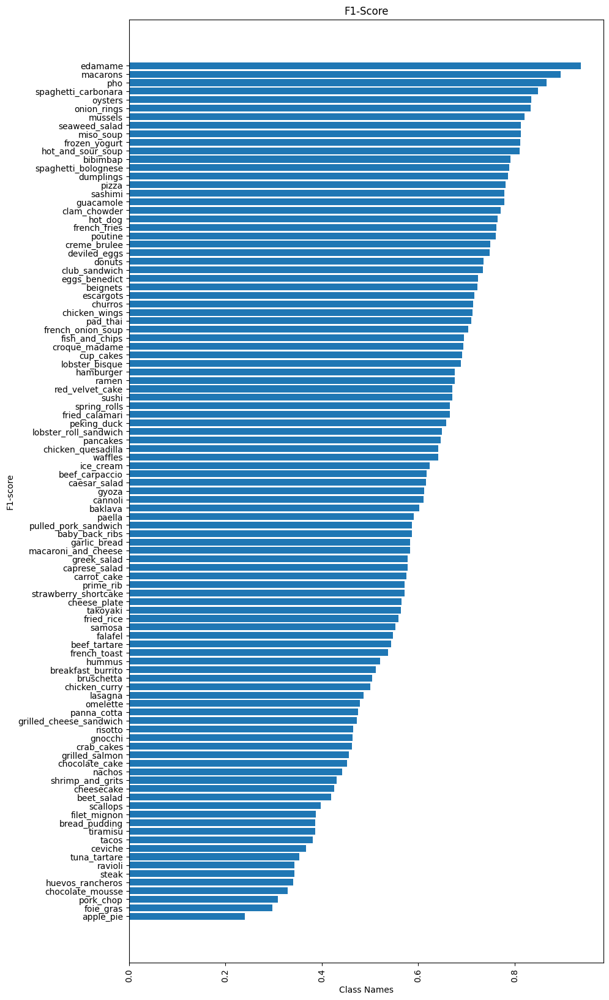

In [52]:
# plotting a f1 score bar graph 
x = f1_scores['class_names']
y = f1_scores['f1-score']


plt.figure(figsize=(10,20))

plt.barh(x,y)
# addlabels(x,y)

plt.title('F1-Score')
plt.xlabel('Class Names')
plt.xticks(rotation =90 )
# plt.yticks(labels=f1_scores)
plt.ylabel('F1-score')
plt.gca().invert_yaxis()


## Visualizing predicitons on Test images 

lets create some functions
* To read in a target image filepath using tf.io.read_file()
* Turn the image into a Tensor using tf.io.deode_image()
* Resize the image tensor to be the same size as the images our model has trained on using tf.image.resize()
* Scale the image to get all of the pixel values between 0 & 1 

In [53]:
# Create a function to load and prepare images 

def load_and_prep_image(filename ,img_shape =224 ,scale =True):
    """
    Reads in an image from filename ,turns it inot a tensor and reshaoes into specified shaoe 

    parameters:
    filename: path of image
    image_shape:height/width of image 
    scale: scales the image to get all pixel values between 0 & 1
    """
    # Read in the image
    img = tf.io.read_file(filename)

    # Decode image into tensor
    img = tf.io.decode_image(img,channels = 3)

    # Resize the image
    img = tf.image.resize(img,[img_shape,img_shape])

    # scale ? yes/NO
    if scale: 
        # rescale the image
        return img/255. # type: ignore
    else:
        return img 


Now we got a funciton whih loads and prep target images , lets use the funtion

1/1 [==============================] - 0s 21ms/step


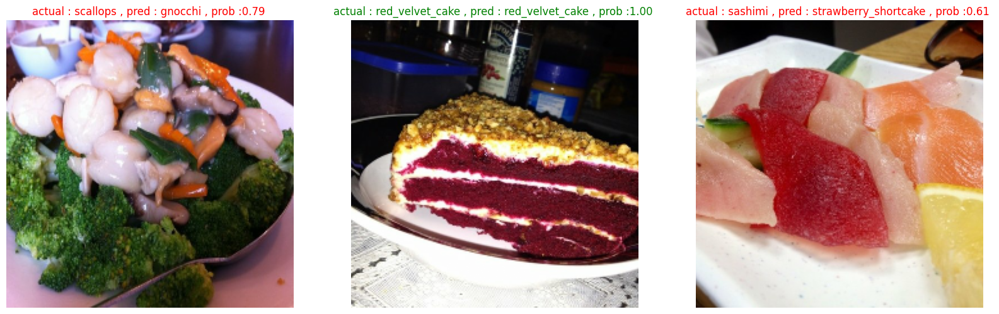

In [112]:
# make preds on a series of random images

import os 
import random 

plt.figure(figsize=(20,20))

for i in range(3):
    class_name = random.choice(class_names)
    filename = random.choice(os.listdir(test_dir + '/' + class_name))
    filepath = test_dir + '/'+ class_name  + '/' + filename
    # print(filepath)

    # Load the image and make predictions
    img = load_and_prep_image(filepath,scale=False)
    pred_prob = model.predict(tf.expand_dims(img,axis = 0)) # type: ignore
    pred_class = class_names[pred_prob.argmax()]

    # print(preds_probs)
    # print(pred_class)

    # plot the image 
    plt.subplot(1,3,i+1)
    plt.imshow(img/255.) # type: ignore
    if class_name == pred_class:
        title_color ='g'
    else:
        title_color='r'
    plt.title(f'actual : {class_name} , pred : {pred_class} , prob :{pred_prob.max():.2f} ',c = title_color)
    plt.axis(False)

## Finding the most wrong predictions 

1. Get all of the image file paths in test dataset using list_files() method
2. Create a pandas DataFrame of the image filepath, gound truth labels,predicted lasses  max prediction probabilites ,prediction class names , ground truth 
3. Use our DataFrame to find all wrong predictions
4. Sort the DataFrame based on wrong predictions
5. Visualize the images with the highest prediction but have the wrong prediciton.

In [113]:
filepaths = []
for filepath in test_data.list_files("./101_food_classes_10_percent/test/*/*.jpg", # type: ignore
                                     shuffle = False):
    filepaths.append(filepath.numpy())

filepaths[:10]

[b'.\\101_food_classes_10_percent\\test\\apple_pie\\1011328.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\101251.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\1034399.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\103801.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\1038694.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\1047447.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\1068632.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\110043.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\1106961.jpg',
 b'.\\101_food_classes_10_percent\\test\\apple_pie\\1113017.jpg']

In [119]:
import pandas as pd 
# pred_probs = model.predict(tf.expand_dims(img,axis = 0))

pred_df = pd.DataFrame.from_dict({'img_path':filepaths,
                       'y_true':y_labels,
                       'y_pred':pred_classes,
                       'pred_conf':pred_prob.max(axis=1), # type: ignore
                       'y_true_classname':[class_names[i] for i in y_labels],
                       'y_pred_classname':[class_names[i] for i in pred_classes]},
                         orient='index')
pred_df = pred_df.transpose()
pred_df

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'.\\101_food_classes_10_percent\\test\\apple_...,0,52,0.610399,apple_pie,gyoza
1,b'.\\101_food_classes_10_percent\\test\\apple_...,0,0,None,apple_pie,apple_pie
2,b'.\\101_food_classes_10_percent\\test\\apple_...,0,0,None,apple_pie,apple_pie
3,b'.\\101_food_classes_10_percent\\test\\apple_...,0,80,None,apple_pie,pulled_pork_sandwich
4,b'.\\101_food_classes_10_percent\\test\\apple_...,0,79,None,apple_pie,prime_rib
...,...,...,...,...,...,...
25245,b'.\\101_food_classes_10_percent\\test\\waffle...,100,100,None,waffles,waffles
25246,b'.\\101_food_classes_10_percent\\test\\waffle...,100,16,None,waffles,cheese_plate
25247,b'.\\101_food_classes_10_percent\\test\\waffle...,100,100,None,waffles,waffles
25248,b'.\\101_food_classes_10_percent\\test\\waffle...,100,94,None,waffles,strawberry_shortcake


In [91]:
# import pandas as pd
# pred_probs = model.predict(tf.expand_dims(img,axis = 0))
# pred_df = pd.DataFrame({"img_path": filepaths,
#                         "y_true": y_labels,
#                         "y_pred": pred_classes,
#                         # "pred_conf": preds_probs.max(axis=1), # get the maximum prediction probability value
#                         "y_true_classname": [class_names[i] for i in y_labels],
#                         "y_pred_classname": [class_names[i] for i in pred_classes]
#                         }) 
# pred_df.head()

In [116]:
y_true_classname = [class_names[i] for i in y_labels]
y_true_classname

['apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'apple_pie',
 'appl

In [57]:
# a = {'img_path':filepaths,
#                        'y_true':y_labels,
#                        'y_pred':pred_classes,
#                        'pred_conf': preds_probs.max(axis =1),
#                        'y_true_classname':[class_names[i] for i in y_labels],
#                        'y_pred_classname':[class_names[i] for i in pred_classes]}

# df = pd.DataFrame.from_dict(a, orient='index')
# df = df.transpose()

In [92]:
# 'pred_conf': preds_probs.max(axis =1),
pred_prob.max(axis=1)

array([0.9980406], dtype=float32)

In [103]:
pred_df['pred_correct'] = pred_df['y_true'] == pred_df['y_pred']
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'.\\101_food_classes_10_percent\\test\\apple_...,0,52,0.998041,apple_pie,gyoza,False
1,b'.\\101_food_classes_10_percent\\test\\apple_...,0,0,None,apple_pie,apple_pie,True
2,b'.\\101_food_classes_10_percent\\test\\apple_...,0,0,None,apple_pie,apple_pie,True
3,b'.\\101_food_classes_10_percent\\test\\apple_...,0,80,None,apple_pie,pulled_pork_sandwich,False
4,b'.\\101_food_classes_10_percent\\test\\apple_...,0,79,None,apple_pie,prime_rib,False


In [104]:
# sort our dataframe to have most wrong predictions at the top
top_100_wrong = pred_df[pred_df['pred_correct'] == False].sort_values('pred_conf' ,ascending = False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'.\\101_food_classes_10_percent\\test\\apple_...,0,52,0.998041,apple_pie,gyoza,False
3,b'.\\101_food_classes_10_percent\\test\\apple_...,0,80,None,apple_pie,pulled_pork_sandwich,False
4,b'.\\101_food_classes_10_percent\\test\\apple_...,0,79,None,apple_pie,prime_rib,False
5,b'.\\101_food_classes_10_percent\\test\\apple_...,0,61,None,apple_pie,lobster_roll_sandwich,False
6,b'.\\101_food_classes_10_percent\\test\\apple_...,0,29,None,apple_pie,cup_cakes,False
8,b'.\\101_food_classes_10_percent\\test\\apple_...,0,85,None,apple_pie,samosa,False
11,b'.\\101_food_classes_10_percent\\test\\apple_...,0,12,None,apple_pie,cannoli,False
12,b'.\\101_food_classes_10_percent\\test\\apple_...,0,14,None,apple_pie,carrot_cake,False
13,b'.\\101_food_classes_10_percent\\test\\apple_...,0,2,None,apple_pie,baklava,False
14,b'.\\101_food_classes_10_percent\\test\\apple_...,0,12,None,apple_pie,cannoli,False


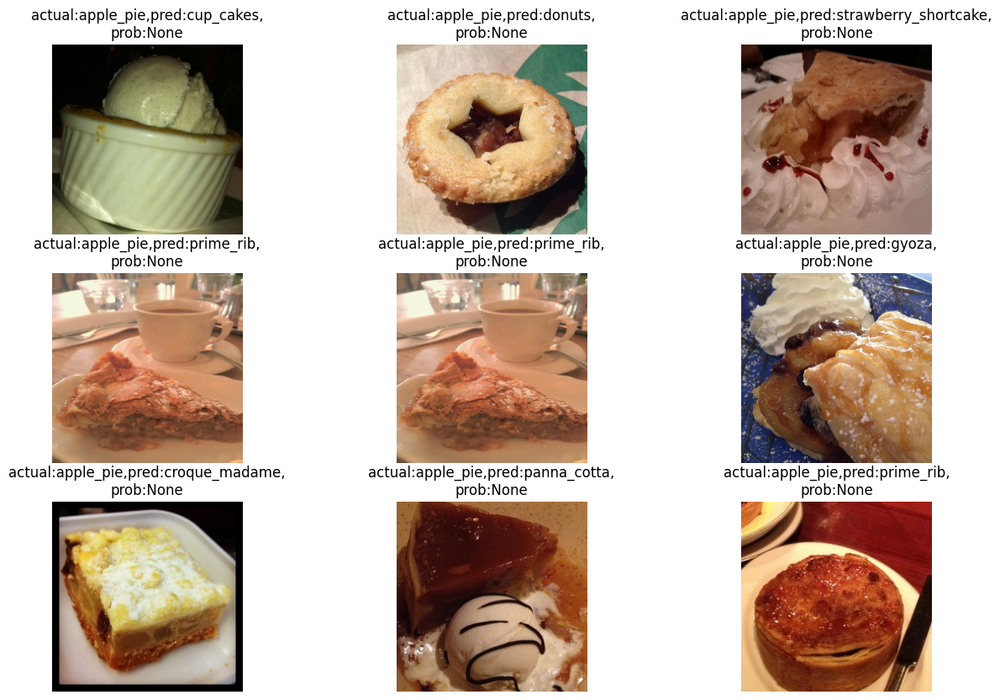

In [122]:
# Visulaize the test data sample which have the wrong prediction but highest prediction Probability 

images_to_view = 9
start_index = 20
plt.figure(figsize=(15,10))
for i , row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
    plt.subplot(3,3,i+1)
    img = load_and_prep_image(row[1],scale=False)
    _,_,_,_,pred_prob,y_true_classname,y_pred_classname,_ = row
    plt.imshow(img/255) # type: ignore
    plt.title(f'actual:{y_true_classname},pred:{y_pred_classname},\nprob:{pred_prob}')
    plt.axis(False)

In [121]:
pred_prob


array([[7.12509382e-06, 5.12173637e-11, 2.51198890e-05, 1.09586988e-04,
        3.88078333e-05, 8.92500742e-04, 8.87331087e-04, 1.01497161e-11,
        3.12895630e-04, 3.04797632e-10, 6.82140701e-03, 5.25210311e-08,
        6.60153501e-06, 4.18231636e-03, 1.19409044e-04, 9.37671430e-05,
        1.22200167e-02, 1.58758551e-01, 5.44885734e-06, 1.29479973e-08,
        8.52367123e-07, 2.46310879e-06, 1.02990086e-03, 7.06446315e-08,
        6.52832668e-08, 2.79610003e-06, 3.81558563e-09, 8.13687905e-07,
        1.25233601e-08, 4.94448127e-09, 5.44468094e-07, 4.33865243e-05,
        2.28855265e-06, 2.74917028e-07, 6.79667428e-05, 2.09484785e-09,
        5.16730438e-07, 5.04327375e-07, 3.44764861e-09, 1.51879922e-03,
        2.29750350e-02, 1.17538710e-13, 1.16929486e-05, 1.05062350e-08,
        1.02784847e-09, 1.42922427e-03, 2.47125996e-07, 4.49554587e-04,
        3.54583026e-04, 3.11041754e-06, 4.76068664e-07, 5.91361959e-06,
        8.73116051e-07, 7.22612583e-08, 2.93020111e-13, 6.805832

## Test out big dog model on our own custom images 


In [123]:
# Get custom images
unzip_data('custom_food_images.zip')

In [124]:
# Get the custom food images filepaths 

custom_food_images = ['custom_food_images/'+ img_path for img_path in os.listdir('custom_food_images')]
custom_food_images

['custom_food_images/chicken_wings.jpeg',
 'custom_food_images/hamburger.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/ramen.jpeg',
 'custom_food_images/steak.jpeg',
 'custom_food_images/sushi.jpeg']

1/1 [==============================] - 0s 27ms/step


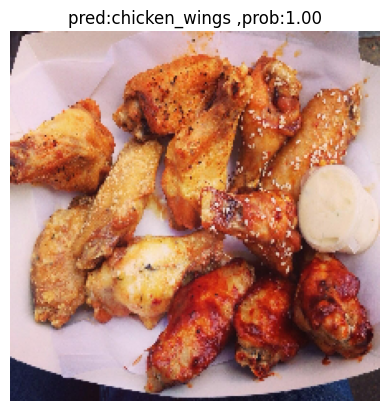

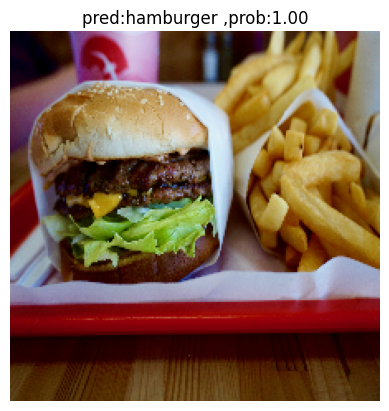

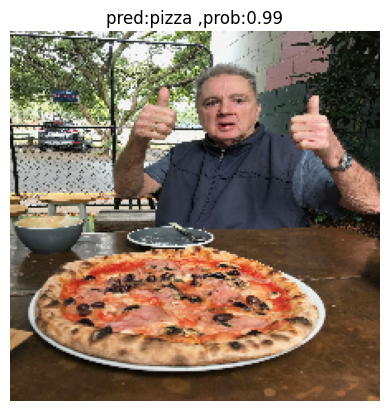

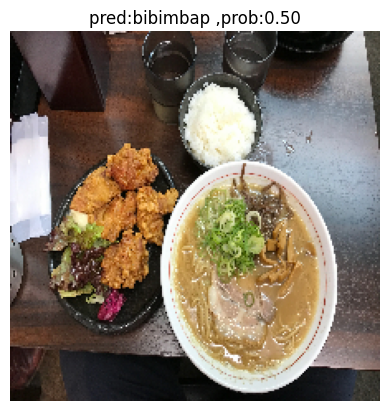

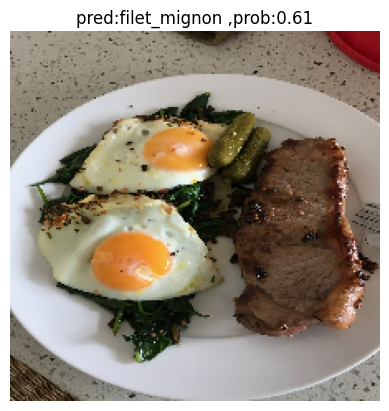

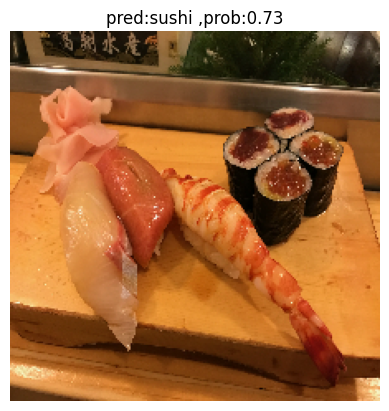

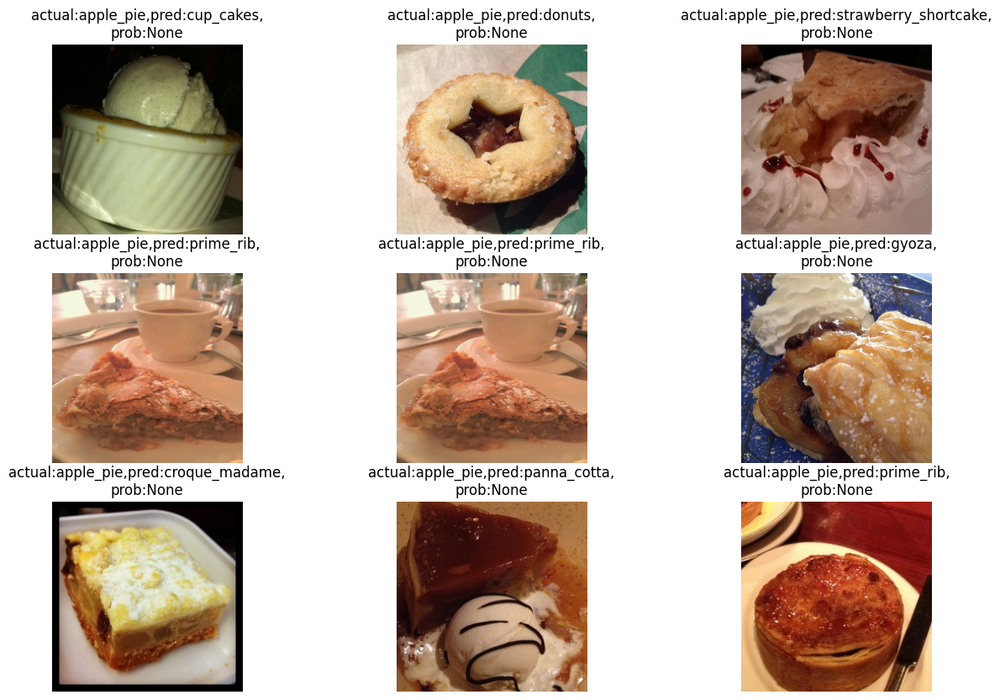

In [129]:
# make predictions on and plot custom food images 

for img in custom_food_images:
    img = load_and_prep_image(img,scale=False)
    pred_prob = model.predict(tf.expand_dims(img ,axis = 0)) # type: ignore
    pred_class = class_names[pred_prob.argmax()]

    # plot the appropriate information 
    plt.figure()
    plt.imshow(img/255.) # type: ignore
    plt.title(f'pred:{pred_class} ,prob:{pred_prob.max():.2f}')
    plt.axis(False)
